In [50]:
# importing the libraries
import os
import numpy as np
import matplotlib.pyplot as plt
from mtcnn import MTCNN
import cv2 as cv
from keras_facenet import FaceNet
%matplotlib inline

# Visualization of face detection of MTCNN

Initiating training..........
1/1 [==============================] - 2s 2s/step


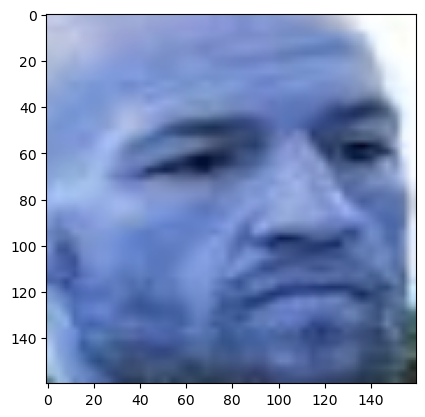

1/1 [==============================] - 0s 78ms/step


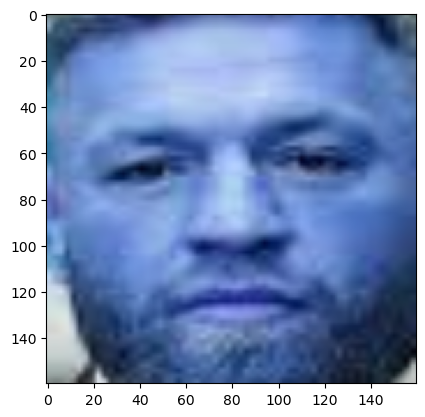

1/1 [==============================] - 0s 79ms/step


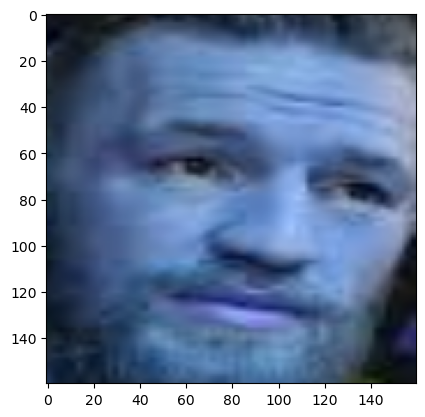

1/1 [==============================] - 0s 63ms/step


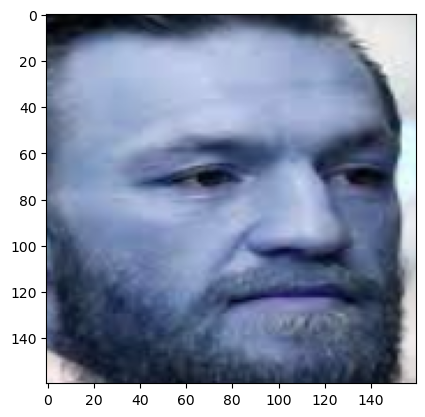

1/1 [==============================] - 0s 63ms/step


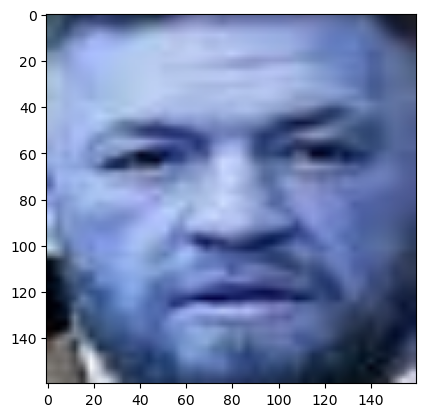

1/1 [==============================] - 0s 69ms/step


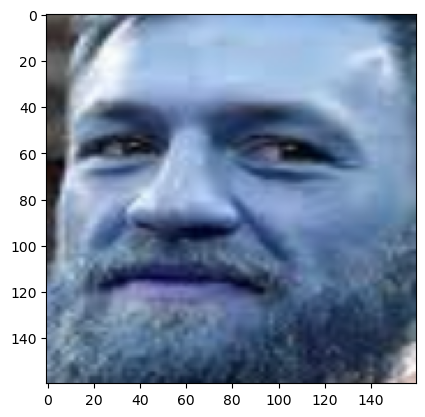

1/1 [==============================] - 0s 47ms/step


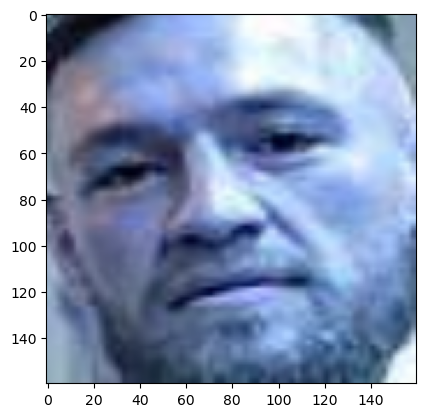

1/1 [==============================] - 0s 63ms/step


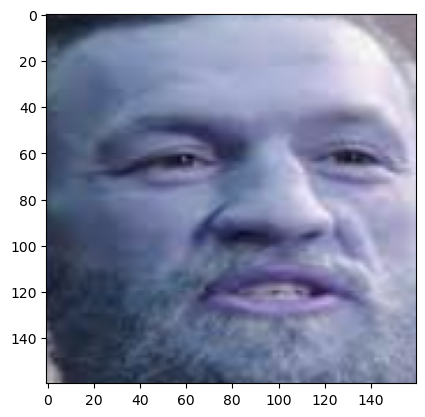

1/1 [==============================] - 0s 63ms/step


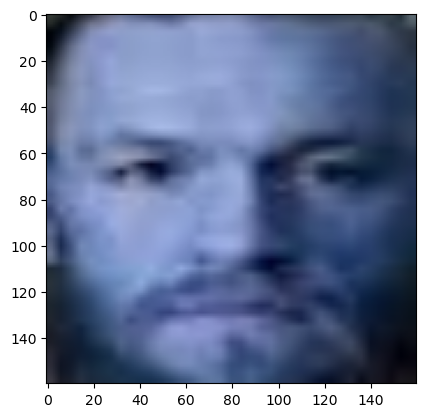

1/1 [==============================] - 0s 47ms/step


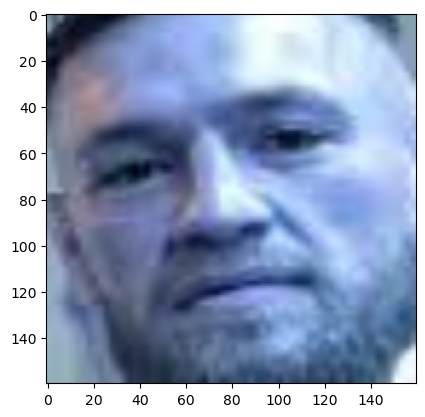

1/1 [==============================] - 0s 47ms/step


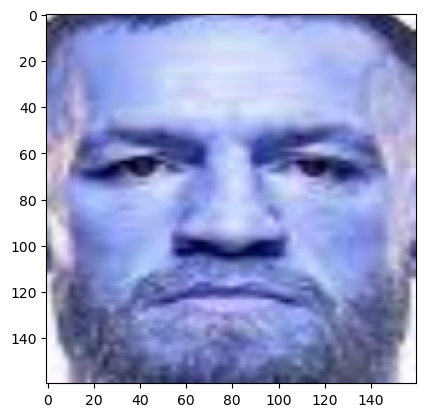

1/1 [==============================] - 0s 51ms/step


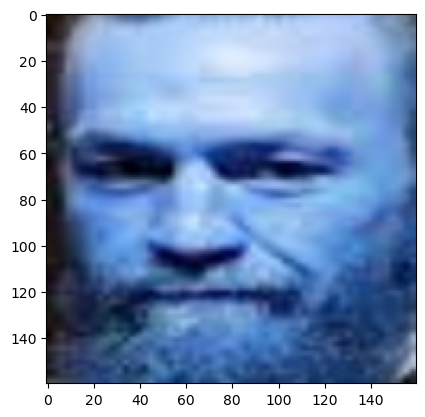

1/1 [==============================] - 0s 63ms/step


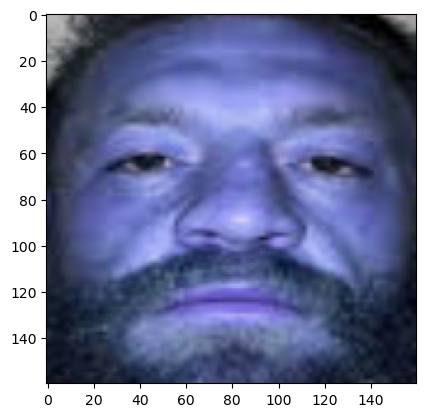

1/1 [==============================] - 0s 66ms/step


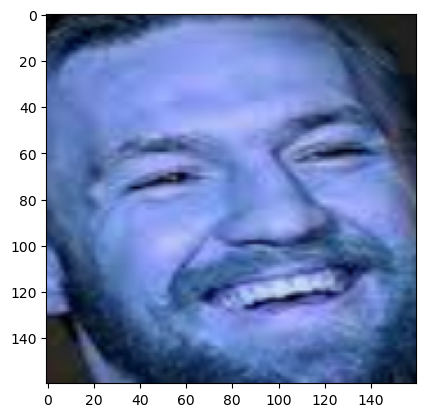

1/1 [==============================] - 0s 63ms/step


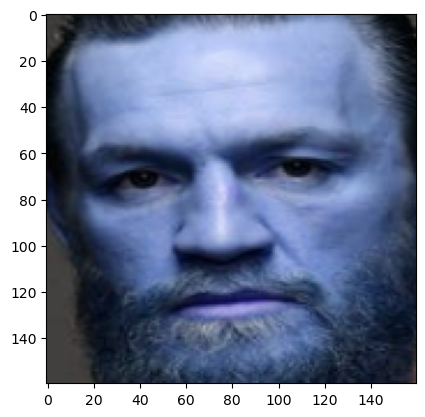

1/1 [==============================] - 0s 78ms/step


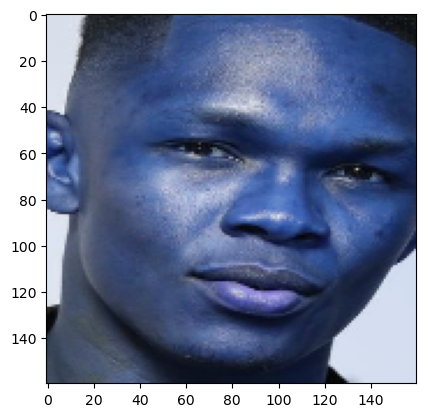

1/1 [==============================] - 0s 63ms/step


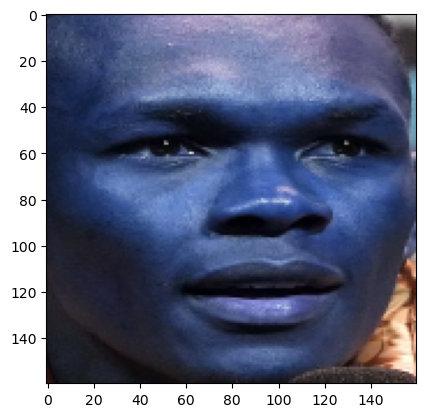

1/1 [==============================] - 0s 71ms/step


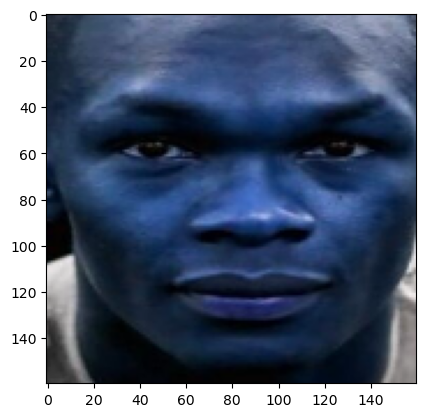

1/1 [==============================] - 0s 63ms/step


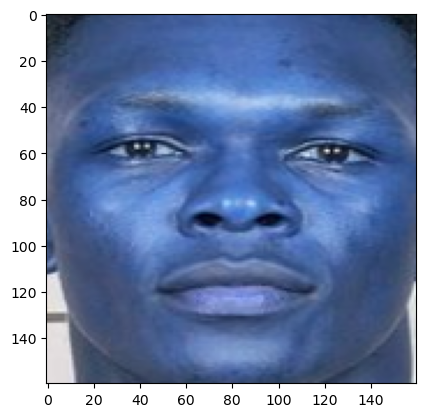

1/1 [==============================] - 0s 63ms/step


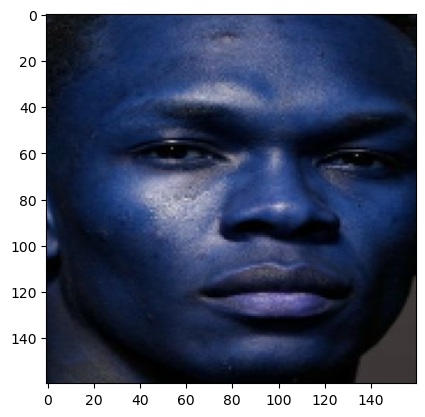

1/1 [==============================] - 0s 63ms/step


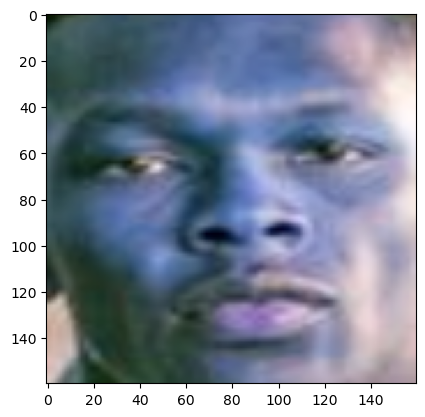

1/1 [==============================] - 0s 78ms/step


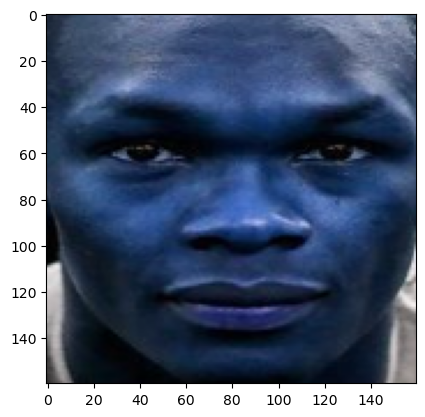

1/1 [==============================] - 0s 47ms/step


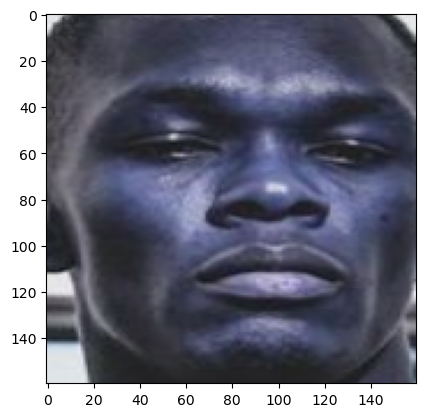

1/1 [==============================] - 0s 63ms/step


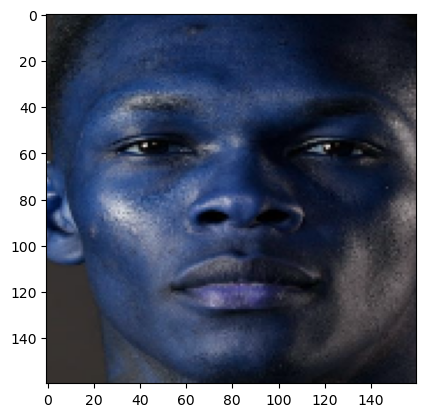

1/1 [==============================] - 0s 63ms/step


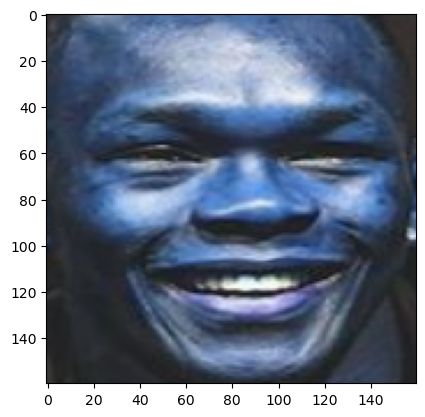

1/1 [==============================] - 0s 63ms/step


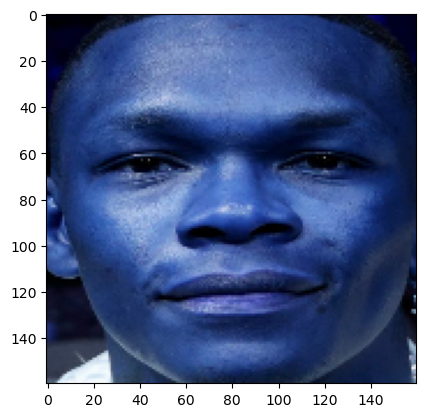

1/1 [==============================] - 0s 56ms/step


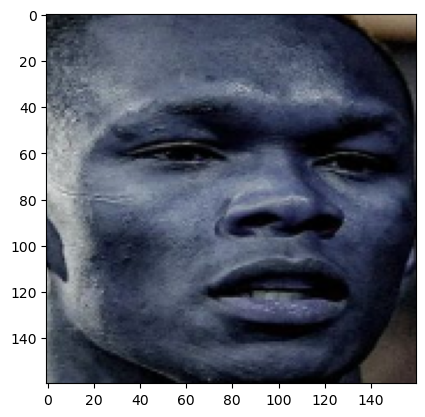

1/1 [==============================] - 0s 58ms/step


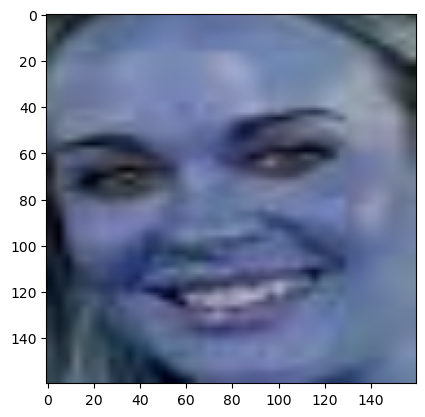

1/1 [==============================] - 0s 63ms/step


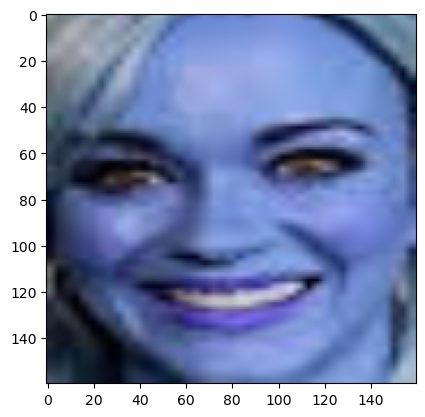

1/1 [==============================] - 0s 47ms/step


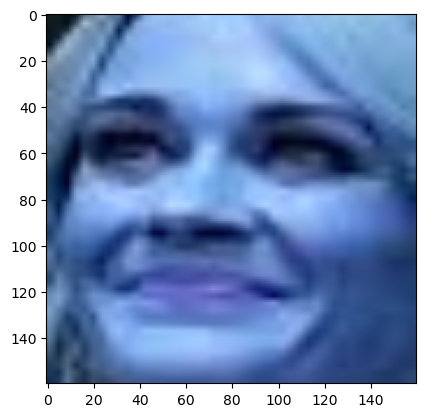

1/1 [==============================] - 0s 70ms/step


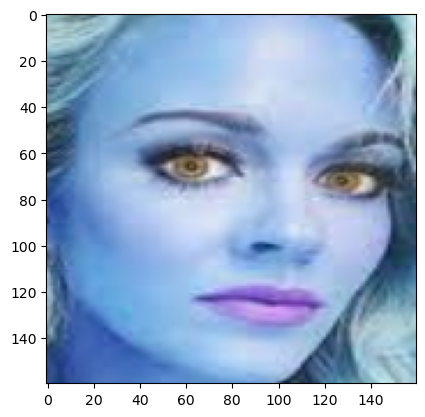

1/1 [==============================] - 0s 63ms/step


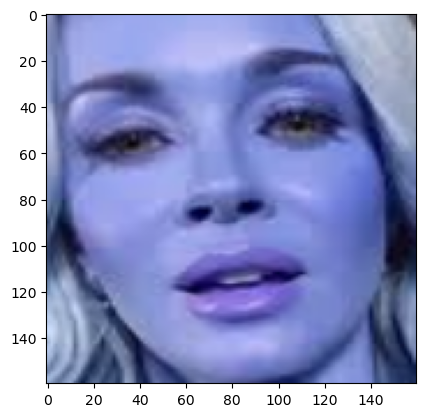

1/1 [==============================] - 0s 63ms/step


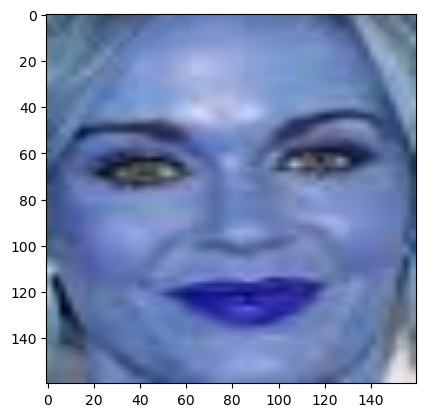

1/1 [==============================] - 0s 47ms/step


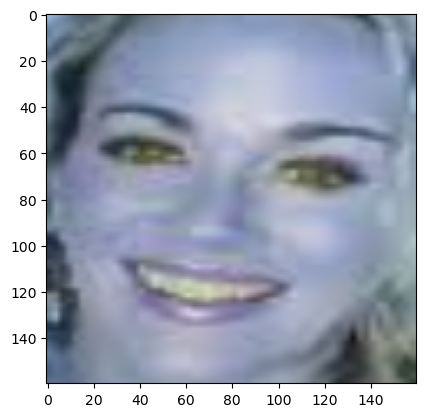

1/1 [==============================] - 0s 59ms/step


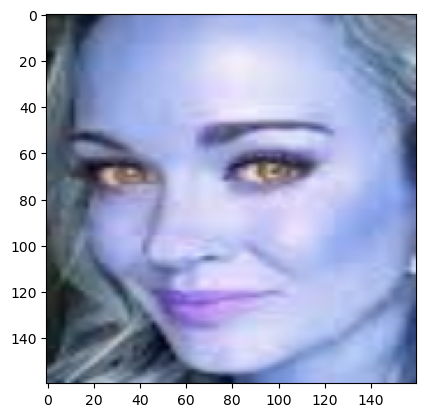

1/1 [==============================] - 0s 63ms/step


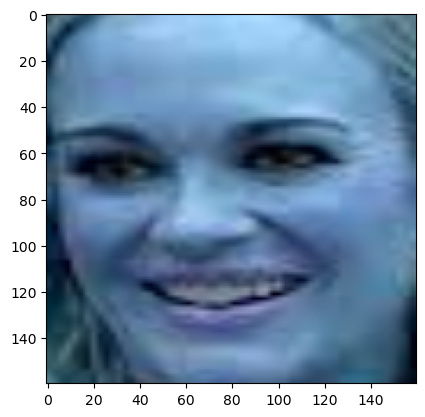

1/1 [==============================] - 0s 63ms/step


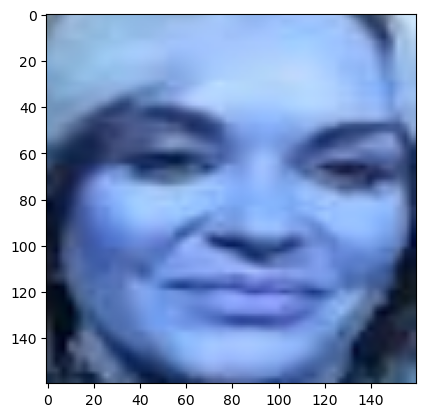

1/1 [==============================] - 0s 63ms/step


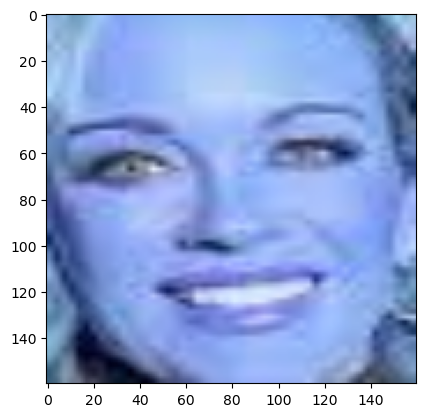

1/1 [==============================] - 0s 55ms/step


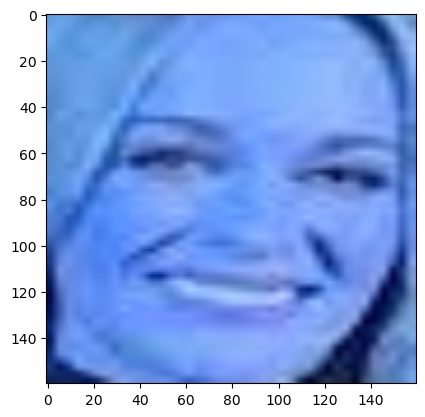

1/1 [==============================] - 0s 63ms/step


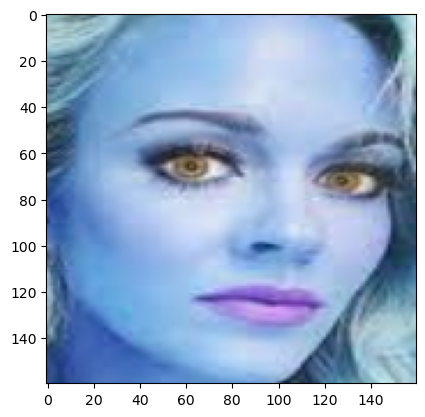

1/1 [==============================] - 0s 47ms/step


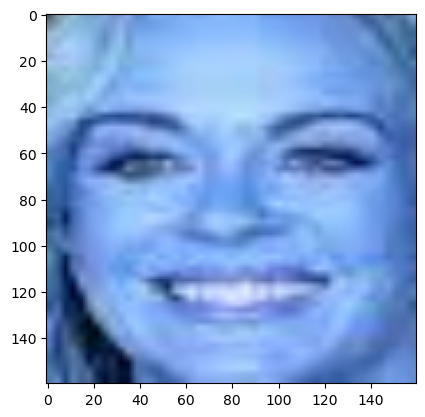

1/1 [==============================] - 0s 62ms/step


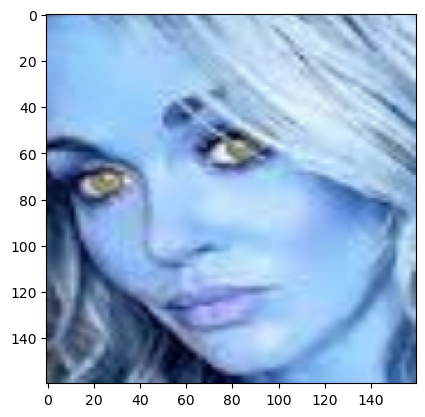

1/1 [==============================] - 0s 47ms/step


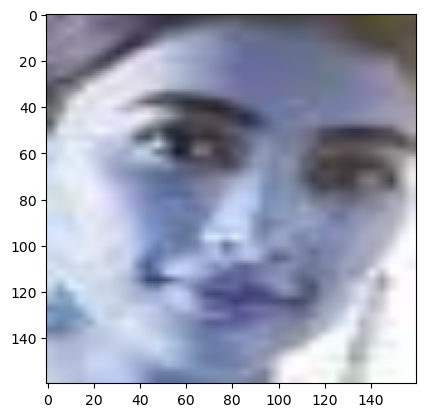

1/1 [==============================] - 0s 63ms/step


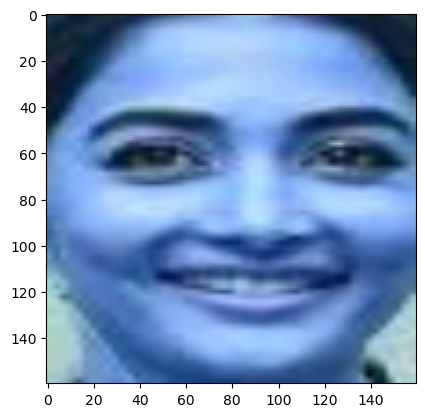

1/1 [==============================] - 0s 63ms/step


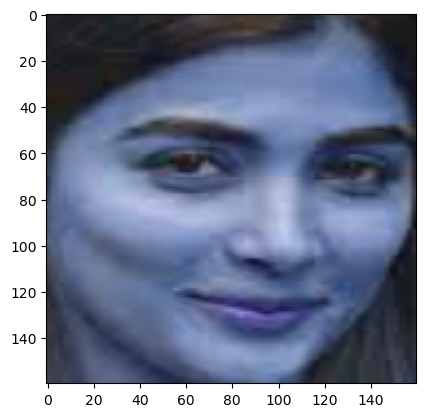

1/1 [==============================] - 0s 58ms/step


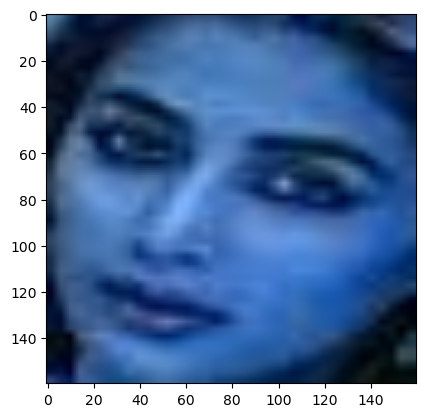

1/1 [==============================] - 0s 68ms/step


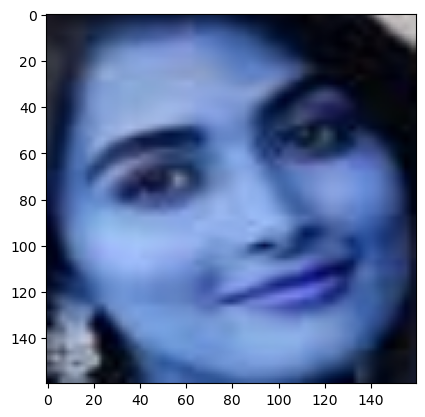

1/1 [==============================] - 0s 63ms/step


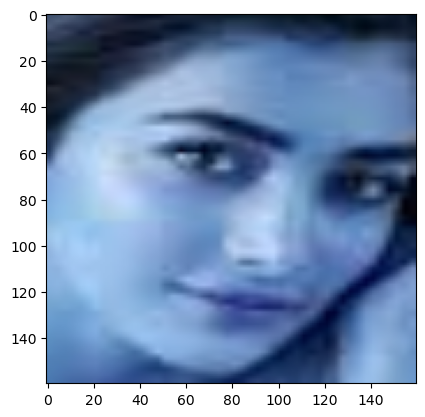

1/1 [==============================] - 0s 47ms/step


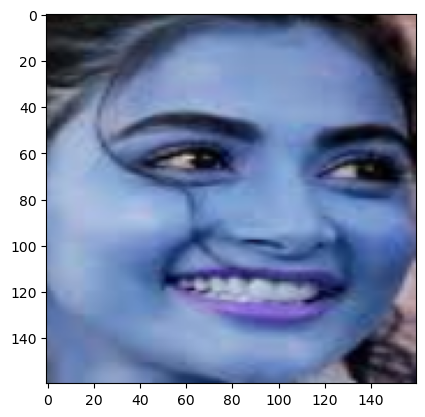

1/1 [==============================] - 0s 61ms/step


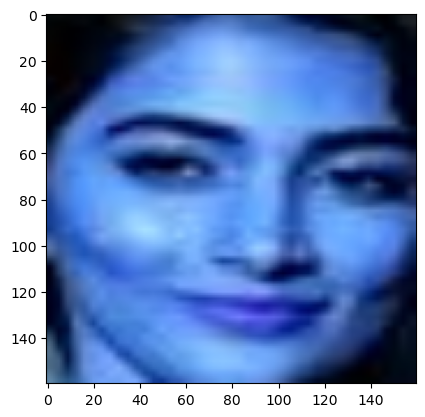

1/1 [==============================] - 0s 64ms/step


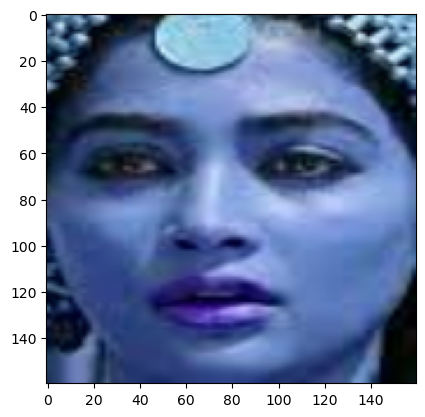

1/1 [==============================] - 0s 73ms/step


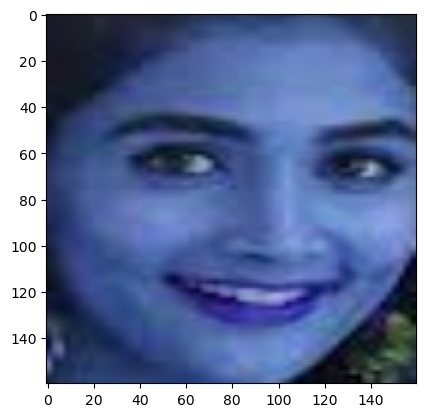

1/1 [==============================] - 0s 60ms/step


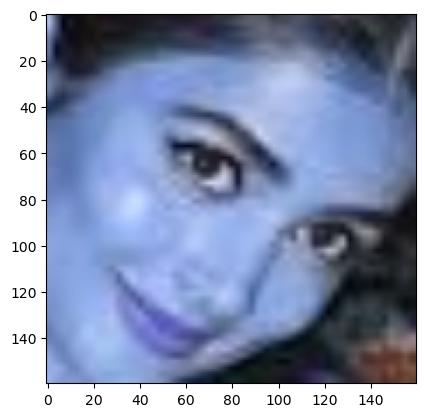

1/1 [==============================] - 0s 62ms/step


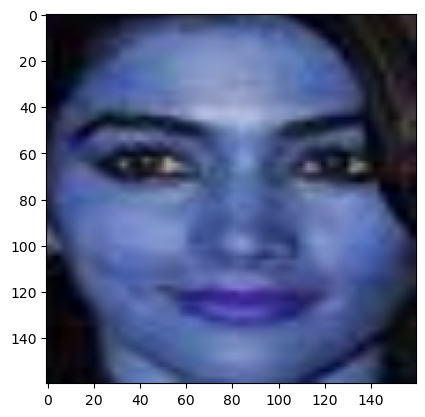

1/1 [==============================] - 0s 63ms/step


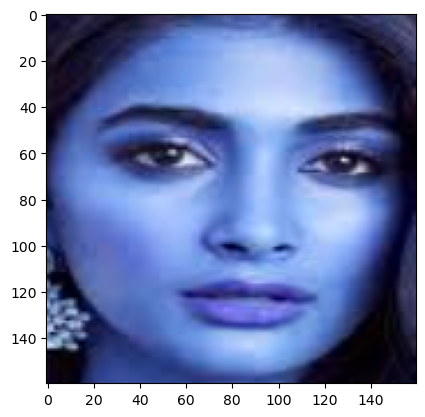

1/1 [==============================] - 0s 63ms/step


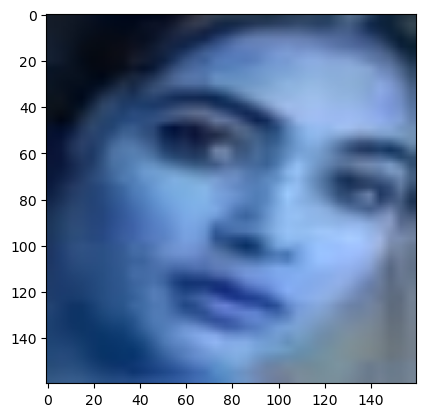

1/1 [==============================] - 0s 58ms/step


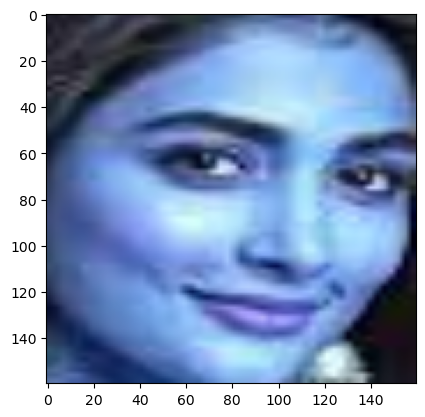

1/1 [==============================] - 0s 63ms/step


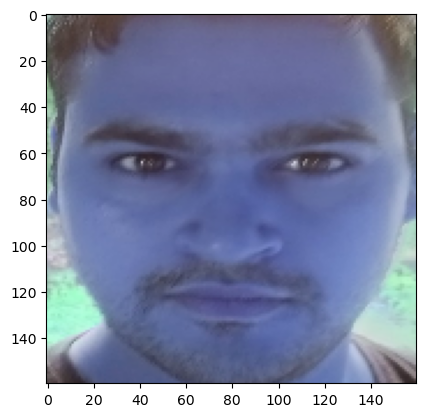

1/1 [==============================] - 0s 47ms/step


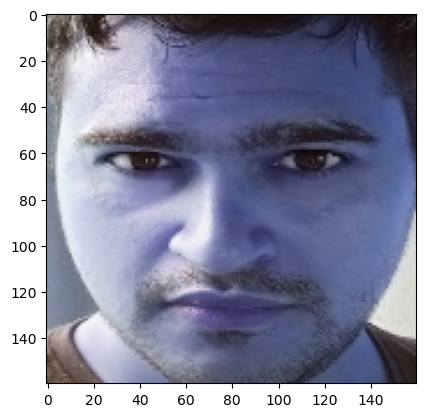

1/1 [==============================] - 0s 63ms/step


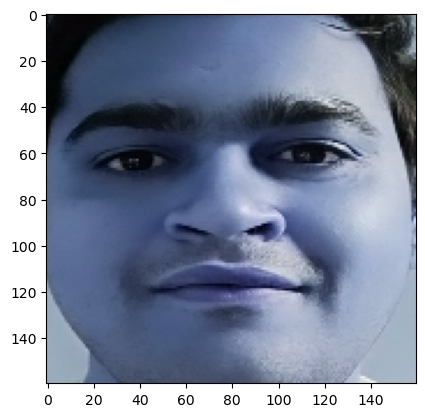

1/1 [==============================] - 0s 63ms/step


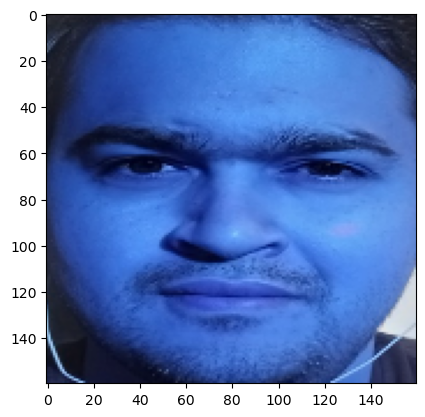

1/1 [==============================] - 0s 63ms/step


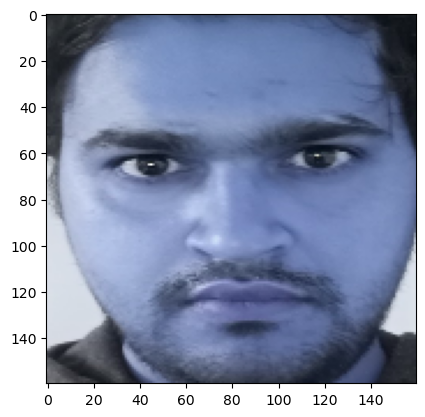

1/1 [==============================] - 0s 78ms/step


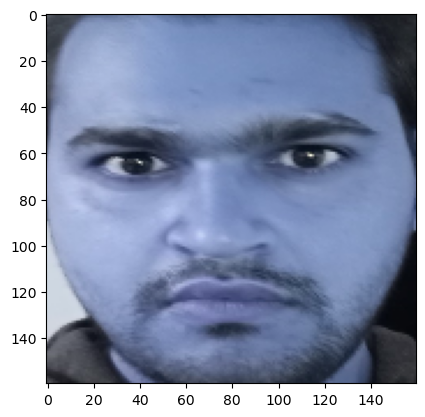

1/1 [==============================] - 0s 63ms/step


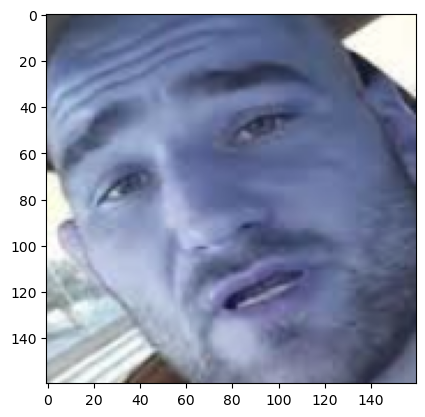

1/1 [==============================] - 0s 63ms/step


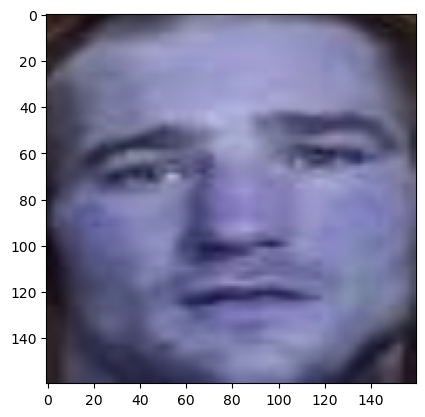

1/1 [==============================] - 0s 63ms/step


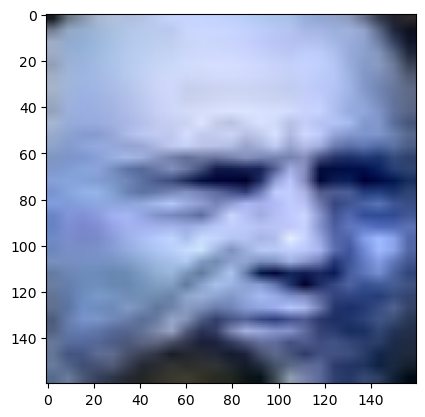

1/1 [==============================] - 0s 68ms/step


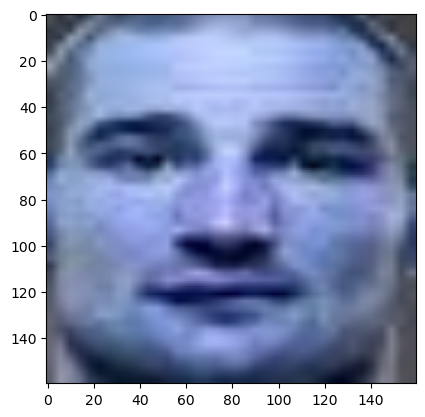

1/1 [==============================] - 0s 63ms/step


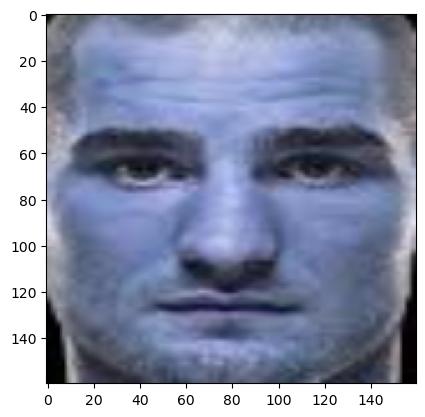

1/1 [==============================] - 0s 47ms/step


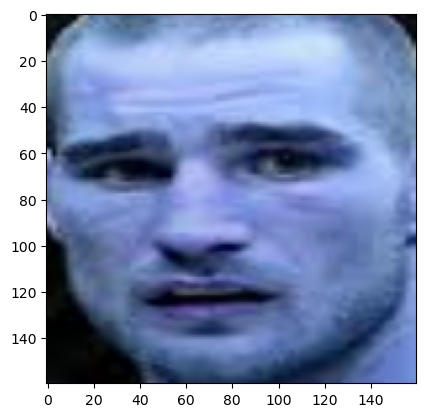

1/1 [==============================] - 0s 63ms/step


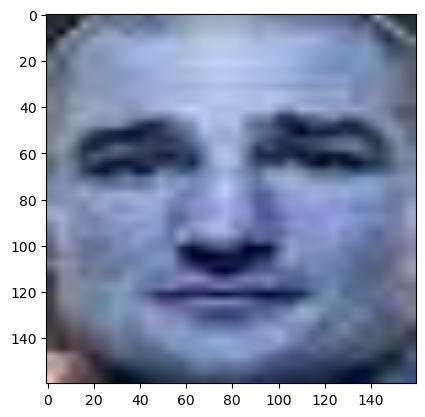

1/1 [==============================] - 0s 63ms/step


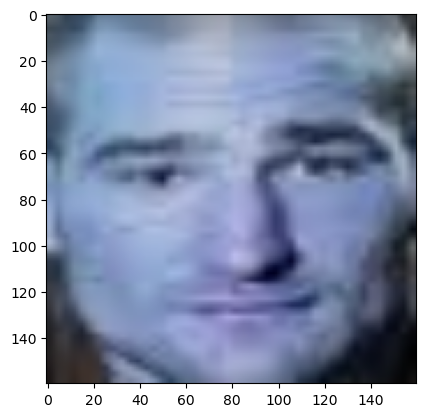

1/1 [==============================] - 0s 63ms/step


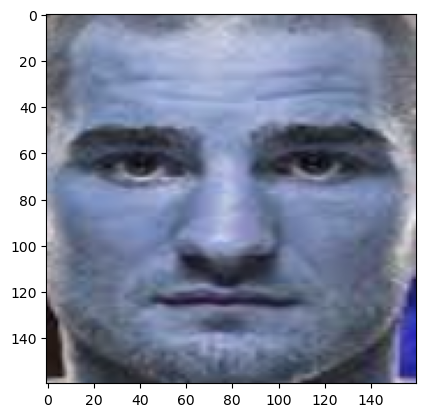

1/1 [==============================] - 0s 47ms/step


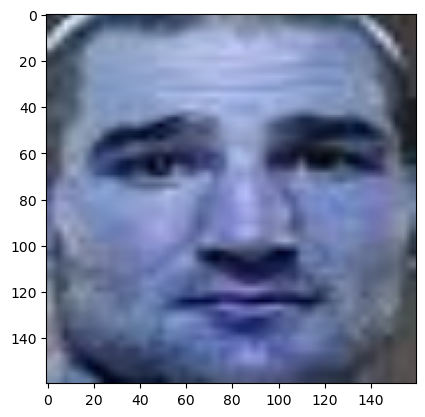

1/1 [==============================] - 0s 65ms/step


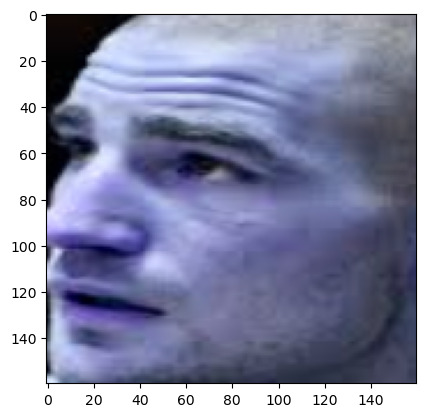

1/1 [==============================] - 0s 63ms/step


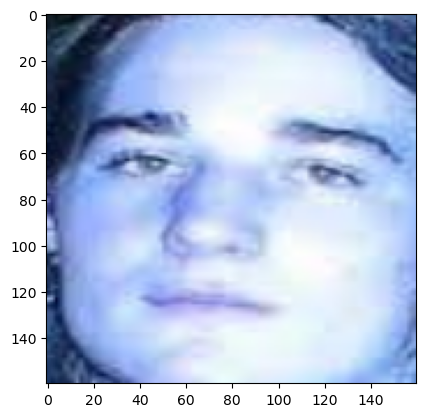

1/1 [==============================] - 0s 48ms/step


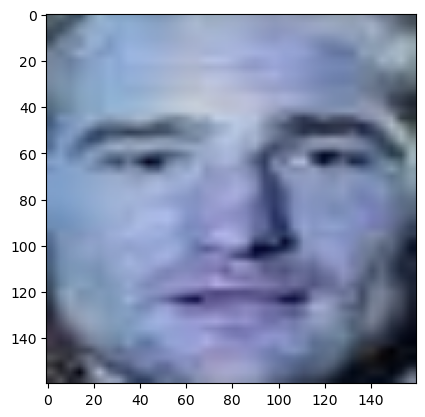

1/1 [==============================] - 0s 47ms/step


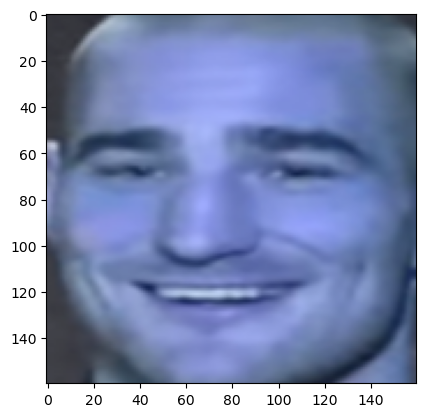

1/1 [==============================] - 0s 63ms/step


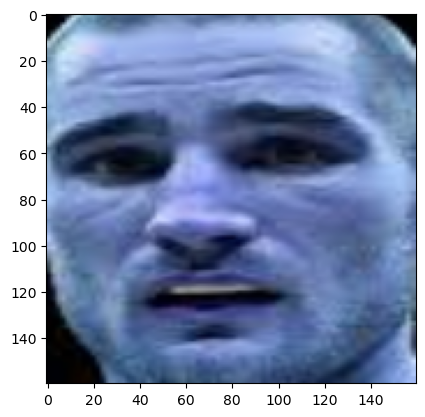

face detection Done................


In [51]:
Dir = r'C:\Users\Rjbha\Desktop\Third_eye\photos'
people = os.listdir(Dir)

featured_faces = []
labels = []


# creating the instances of MTCNN and FaceNet
detector = MTCNN()
embedder = FaceNet()


print('Initiating training..........')
def detect_face():
    for person in people:
        path = os.path.join(Dir, person)
        label = people.index(person)
        for img in os.listdir(path):
            img_path = os.path.join(path, img)
            
            img_array = cv.imread(img_path)
            
            # mtcnn takes RGB colors
            rgb_array = cv.cvtColor(img_array, cv.COLOR_BGR2RGB)
            
            results = detector.detect_faces(rgb_array)
            
            if len(results) != 0:
            
                # extracting bounding boxes
                x,y,w,h = results[0]['box']
                x,y = abs(x), abs(y)

                # extracting face
                face = img_array[y: y+h, x: x+w]

                # resizing it to 160X160
                face = cv.resize(face, (160,160),interpolation = cv.INTER_LINEAR)


                embeddings = embedder.embeddings([face])

                featured_faces.append(embeddings)
                labels.append(label)
                plt.imshow(face)
                plt.show()

            
    
detect_face()
print('face detection Done................')





# Proprocessing for testing the Accuracy

In [52]:
database = dict(zip(labels, featured_faces))

keys = []
for key in database:
    keys.append(key)

X_train = []
y_train = []

for key in keys:
    for value in database[key]:
        X_train.append(value.tolist())
        y_train.append(key)

In [53]:
from sklearn import svm
machine_model = svm.SVC()

In [54]:
import random
temp = list(zip(X_train,y_train))
random.shuffle(temp)
X_train, y_train = zip(*temp)

In [55]:
%%time
machine_model.fit(X_train, y_train)

Wall time: 0 ns


SVC()

## Testing 
- save the images in the root folder. (Here in my case root folder is 'Third_eye')
- To test change the name of the pic in first line of below code cell.(here i've put 'test_3.jpg')

1/1 [==============================] - 0s 80ms/step


-1

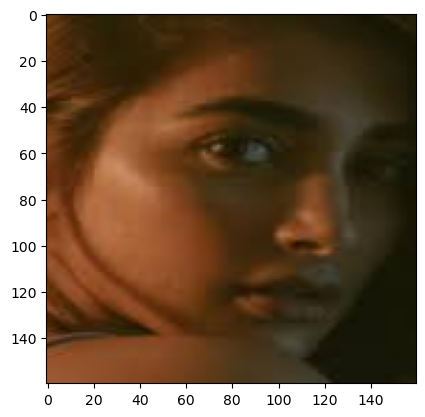

In [56]:
pic = cv.imread('test_3.jpg') 

pic = cv.cvtColor(pic, cv.COLOR_BGR2RGB)
pic1 = detector.detect_faces(pic)
pic1[0]['box']

x,y,w,h = pic1[0]['box']
x,y = abs(x), abs(y)
pic2 = pic[y: y+h, x: x+w]
pic2
pic2 = cv.resize(pic2, (160, 160), interpolation = cv.INTER_LINEAR)
plt.imshow(pic2)
pic2 = embedder.embeddings([pic2])
cv.waitKey(0)

In [57]:
prediction = machine_model.predict(pic2)
print('label for index in people list: ', prediction)
print('person recognized: ', people[int(prediction)])

label for index in people list:  [3]
person recognized:  pooja hegde


# Final Implementation of Facial recognition Using FaceNet and MTCNN
- Create Instance of class FacialRecognitionTraining.
- Call the method createDetection()
    - It will train the images in our folder. here we have images in 'photos' folder.
- Call the method createRecognization()
    - Primary camera would pop up and it will detect the face and put a rectangle around face detected.
    - Subsequently recognized the face and put text to it.
- To End press 'q' in your keyboard.

In [1]:
# importing the libraries
import os
import numpy as np
from mtcnn.mtcnn import MTCNN
import cv2 as cv
from keras_facenet import FaceNet
from sklearn import svm
import random
%matplotlib inline

class FacialRecognitionTraining:
    Dir = r'C:\Users\Rjbha\Desktop\Third_eye\photos'
    people = os.listdir(Dir)

    featured_faces = []
    labels = []
    database = {}
    
    def __init__(self):
        self.detector = MTCNN()
        self.embedder = FaceNet()
        self.machine_model = svm.SVC()
    
    def __str__(self):
        return 'initiating training.........'
        
    def createDetection(self):
        
        for person in self.people:
            path = os.path.join(self.Dir, person)
            label = self.people.index(person)
            for img in os.listdir(path):
                img_path = os.path.join(path, img)
            
                img_array = cv.imread(img_path)
            
                # mtcnn takes RGB colors
                rgb_array = cv.cvtColor(img_array, cv.COLOR_BGR2RGB)

                results = self.detector.detect_faces(rgb_array)

                if len(results) != 0:

                    # extracting bounding boxes
                    x,y,w,h = results[0]['box']
                    x,y = abs(x), abs(y)

                    # extracting face
                    face = img_array[y: y+h, x: x+w]

                    # resizing it to 160X160
                    face = cv.resize(face, (160,160),interpolation = cv.INTER_LINEAR)


                    embeddings = self.embedder.embeddings([face])

                    self.featured_faces.append(embeddings)
                    self.labels.append(label)
                
        self.database = dict(zip(self.labels, self.featured_faces))
        keys = []
        for key in self.database:
            keys.append(key)

        X_train = []
        y_train = []

        for key in keys:
            for value in self.database[key]:
                X_train.append(value.tolist())
                y_train.append(key)

        temp = list(zip(X_train,y_train))
        random.shuffle(temp)
        X_train, y_train = zip(*temp)

        self.machine_model.fit(X_train, y_train)

    def createRecognization(self):

        video_capture = cv.VideoCapture(0)

        while True:
            ret, frame = video_capture.read()
            pic = cv.cvtColor(frame, cv.COLOR_BGR2RGB)
            if ret == True:
               
                face_rect = self.detector.detect_faces(pic)
                if len(pic)>0:
                    x,y,w,h = face_rect[0]['box']
                    x,y = abs(x), abs(y)
                    faces_roi = pic[y: y+h, x: x+w]
                    faces_roi = cv.resize(faces_roi, (160, 160), interpolation = cv.INTER_LINEAR)
                    faces_roi = self.embedder.embeddings([faces_roi])
                    label = self.machine_model.predict(faces_roi)[0]
                    cv.putText(frame, str(self.people[label]), (20,20), cv.FONT_HERSHEY_COMPLEX, 1.0,(0,255,0), thickness=2)
                    cv.rectangle(frame, (x,y), (x+w, y+h), (0,255,0), thickness=2)
                cv.imshow('Detected face: ', frame)
                if cv.waitKey(1) & 0xFF == ord('q'):
                    break
        video_capture.release()
        cv.destroyAllWindows()



In [2]:
facial_recognition = FacialRecognitionTraining()

In [3]:
facial_recognition.createDetection()

1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 67ms/step


In [4]:
facial_recognition.createRecognization()

1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 60ms/step
